In [88]:
# ーーーーー 準備 ーーーーーーー
import numpy as np
# import picamera
from PIL import Image
from time import sleep
from sklearn.cluster import KMeans
import cv2
import os
print('print(cv2.__version__)')
print(cv2.__version__)

print(cv2.__version__)
3.4.2


In [69]:
### -paths- ###
# 背景のパス
background_path = "/Users/user/programing/diveintocode-ml/Group_project/pet-bottle-pic/test/back_graund.jpeg"
# テンプレート:登録商品のパス
temp_path = "/Users/user/programing/diveintocode-ml/Group_project/pet-bottle-pic/test/template_pic"

# 写真撮影した場合のパス
# photo_filename = '/tmp/data.jpg'

# 精度確認テスト用のパス
# path_camera_pic = "/Users/user/programing/diveintocode-ml/Group_project/pet-bottle-pic/test/template_pic"
path_camera_pic = "/Users/user/programing/diveintocode-ml/Group_project/pet-bottle-pic/test/camera_pic"
# path_camera_pic = "/home/pi/self-checkout_10/picfile"

In [90]:
### -スケール調整-関数 ###
def scale_to_width(img, width):
    """
    アスペクト比を固定して、幅が指定した値になるようリサイズする。
    """
    scale = width / img.shape[1]
    return cv2.resize(img, dsize=None, fx=scale, fy=scale)

### -登録商品と価格 ###
money = {'Rooibos_tea':110, 'CC_lemon':120, 'Aquarius':130, 'Carbonic_water':140, 'Jasmin_tea':150}

### -background画像-準備 ###
background_image = cv2.imread(background_path)
# 色変換
background_image= cv2.cvtColor(background_image, cv2.COLOR_BGR2RGB)
# スケールダウン
background_image = scale_to_width(background_image, 224)
# 画像にぼかしをかける（誤検出防止のためのノイズ除去）:cv2.GaussianBlur(入力画像,(畳み込むサイズ),標準偏差）
background_image = cv2.GaussianBlur(background_image, (5, 5), 0)

In [ ]:
import matplotlib.pyplot as plt

In [101]:

### -登録商品画像５個-準備 ###
print('### -登録商品画像５個-準備 ###')
temp_files = os.listdir(temp_path)
print(temp_files)
temp_data = []
for data in temp_files:
    temp = cv2.imread(temp_path + "/" + data)
#     print('元画像')
#     print(temp.shape)
#     plt.imshow(temp)
#     plt.show()
    
    temp = cv2.cvtColor(temp,cv2.COLOR_BGR2RGB)
#     print('色変換あと')
#     print(temp.shape)
#     plt.imshow(temp)
#     plt.show()
    
    temp = scale_to_width(temp, 224)
#     print('スケールダウンあと')
#     print(temp.shape)
#     plt.imshow(temp)
#     plt.show()
    
    box_added_pic, temp = objection_detect(background_image, temp)
#     print('物体検出あと')
#     print(temp.shape)
#     plt.imshow(temp)
#     plt.show()
    
#     plt.imshow(box_added_pic)
#     plt.show()
    
# #     temp = scale_to_width(temp, 224)
#     print('スケールダウンあと')
#     print(temp.shape)
#     print()
#     print()
    temp_data.append(temp)

### - 精度確認テスト用画像-準備 ###
print('### - 精度確認テスト用画像-準備 ###')
camera_files = os.listdir(path_camera_pic)
camera_files = [files for files in camera_files]
print(camera_files)

### -登録商品画像５個-準備 ###
['Rooibos_tea.jpg', 'CC_lemon.jpg', 'Aquarius.jpg', 'Carbonic_water.jpg', 'Jasmin_tea.jpg']
### - 精度確認テスト用画像-準備 ###
['geogia.jpg', 'namacha.jpg', 'namacha3.jpg', 'namacha2.jpg', 'georgia4.jpg', 'water4.jpg', 'cc4.jpg', 'aquari.jpg', 'jasmin4.jpg', 'aquari3.jpg', 'pepushi.jpg', 'water.jpg', 'ruibos6.jpg', 'pepushi5.jpg', 'ruibos4.jpg', 'pepushi2.jpg', 'jasmin.jpg', 'cc.jpg']


In [67]:
### -カメラ撮影-関数 ###
# def shutter():
#     """
#     カメラで写真を撮って'/tmp/data.jpg'に保存する。
#     撮影のプレビュー見せる。
#     """
#     photofile = open(photo_filename, 'wb')
#     # pi camera 用のライブラリーを使用して、画像を取得
#     with picamera.PiCamera() as camera:
#         # プレビューの解像度（適当）
#         # camera.resolution = 90
#         camera.start_preview()
#         sleep(1.000)
#         camera.capture(photofile)
#         camera.stop_preview()

# ＝＝＝＝＝＝＝ 物体検出　始まり ＝＝＝＝＝＝

### bounding_boxの範囲決定-関数 ###
def get_x_y_limit(Y, X, result, cluster):
    NO = np.where(result==cluster)
    x_max = np.max(X[NO])
    x_min = np.min(X[NO])
    y_max = np.max(Y[NO])
    y_min = np.min(Y[NO])
    x_max = int(x_max)
    x_min = int(x_min)
    y_max = int(y_max)
    y_min = int(y_min)
    return x_min, y_min, x_max, y_max

### bounding_boxの生成と切り取り-関数 ###
def bounding_box(img, x_min, y_min, x_max, y_max):
    # 長方形を生成cv2.rectangle(イメージデータ、（左上の座標)、（右下の座標）、（BGR色指定）、（線の太さ））
    img = cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 5)
    # bounding_box部分のみ切り取り
    truncated = img[y_min:y_max, x_min:x_max]
    # imgはbox付きの元画像、truncatedは切り取った画像
    return img, truncated

### -main-物体検出-関数 ###
def objection_detect(background_image, product_image):
    # 画像にぼかしをかける（誤検出防止のためのノイズ除去）:cv2.GaussianBlur(入力画像,(畳み込むサイズ),標準偏差）
    product_image_Blured = cv2.GaussianBlur(product_image, (5, 5), 0)
    # 背景差分するためのmaskモデル
    fgbg = cv2.bgsegm.createBackgroundSubtractorMOG()
    # 背景の投入
    fgmask = fgbg.apply(np.uint8(background_image))
    # 撮影画像の投入
    fgmask = fgbg.apply(np.uint8(product_image_Blured))
    # 差がある部分の座標を抽出
    Y, X = np.where(fgmask > 200)
    # Kmansによる背景と入力画像との違いをクラスタ分類
    y = KMeans(n_clusters=1, random_state=0).fit_predict(np.array([X,Y]).T)
    # 上記で定義したget_x_y_limit関数による、bounding_boxの範囲の抽出
    x_min, y_min, x_max, y_max = get_x_y_limit(Y, X, y, 0)
    return bounding_box(product_image, x_min, y_min, x_max, y_max)

# ＝＝＝＝＝＝＝ 物体検出 終わり ＝＝＝＝＝＝

In [95]:
# ＝＝＝＝＝＝＝ 画像分類 始まり　＝＝＝＝＝＝
# path, param=0.72, num=4
### -main-画像分類-関数 ###
def classfiler(temp_files, temp_data, img, param=0.59, num=6):
    """
    テンプレート画像と撮った写真がマッチしているかどうか。
    マッチしている場合はマッチしたテンプレート名を返す。
    マッチしてない場合は何も返さない。
    詳細:
    SIFTを用いた画像分類
    パラメーターとして以下を調整
    param：最も近い点と2番目に近い点の距離の比率。
    num：マッチした特徴点の数の下限
    """
    # 画像マッチング テンプレートの写真とマッチしているかどうかの判断
    for temp, temp_file in zip(temp_data, temp_files):
#         print('分類器が比較した登録写真')
#         print(temp_file)
        #特徴抽出機の生成
        # detector = cv2.AgastFeatureDetector_create()  #エラー
        # detector = cv2.FastFeatureDetector_create()  #エラー
        # detector = cv2.MSER_create()  #エラー
        # detector = cv2.AKAZE_create()  #エラー
        # detector = cv2.BRISK_create()  #エラー
        # detector = cv2.KAZE_create()    #暗くても当たりやすいが遅い
        # detector = cv2.ORB_create()   #途中でエラー
        # detector = cv2.SimpleBlobDetector_create()  #エラー
        detector = cv2.xfeatures2d.SIFT_create()
        #kpは特徴的な点の位置 destは特徴を現すベクトル
        kp1, des1 = detector.detectAndCompute(temp, None)
        kp2, des2 = detector.detectAndCompute(img, None)
        #特徴点の比較機
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1,des2, k=2)
        #割合試験を適用(２番目との差を param)
        good = []
        match_param = param
        for m,n in matches:
            if m.distance < match_param*n.distance:
                good.append([m])
        # good特徴点 num 個以上でマッチしたとする
        if len(good)>num:
            name = temp_file.strip(".jpg'")#.jpgとる
            return name

# ＝＝＝＝＝＝＝ 画像分類 終わり ＝＝＝＝＝＝
# ーーーーー 準備 終わり ーーーーーーー

In [100]:
# # ========= main_part ===========
# if __name__ == '__main__':
#     while True:
#         money_sum = 0 
#         # 何らかのキー操作があるまで待機（何でもいいが、とりあえず「Enter」を押すように伝える）
#         key = input('商品をスキャンする場合は「Enter」を押して下さい')
#         while True:
# #             撮影環境ないのでとりあえず登録写真でテストする。
#             for files in camera_files:
#                 print('撮影写真')
#                 print(files)
#                 # 撮影画像読み込み
#                 img = cv2.imread(path_camera_pic + "/" + files)
#                 # 画像をBGRカラーに変換
#                 img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#                 # スケールダウン
#                 img = scale_to_width(img, 224)
#                 # 物体検出
#                 img, truncated = objection_detect(background_image, img)
#                 # 分類、登録商品とそれ以外で分けてる
#                 plt.imshow(truncated)
#                 plt.show()
                
# #                  # スケールダウン
# #                 truncated = scale_to_width(truncated, 224)

#                 name = classfiler(temp_files, temp_data, truncated, param=0.59, num=6)
#                 # 分類関数から名前が出力されない場合は未登録を連絡。
#                 if not name:
#                     print("登録商品ではありません")
#                 # その他　マッチした商品名を伝えて、今の小計金額を連絡。
#                 else:
#                     print(name)
#                     money_sum += money[name]
#                     print("小計",money_sum)
#                 # y以外の入力があった場合は合計金額を伝えて、ループをブレークし、money_sum = 0に戻す
#                 key = input('続けて商品をスキャンする場合は「y + Enter」,会計する場合は「Enter」を押して下さい')
#                 if key != 'y':
#                     print("合計:{}円".format(money_sum))
#                     break

# モデルのテスト

背景に使った写真
(168, 224, 3)


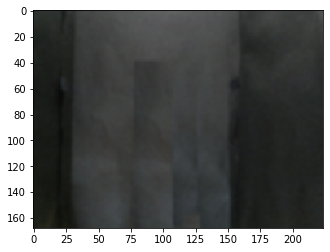




**************************
登録写真についてのモデル精度
**************************
元画像
Rooibos_tea.jpg
(2464, 3280, 3)


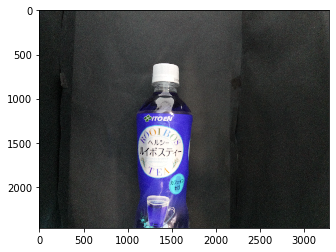


色変換あと
(2464, 3280, 3)


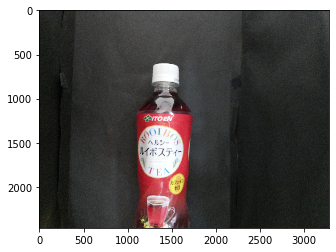


スケールダウンあと
(168, 224, 3)


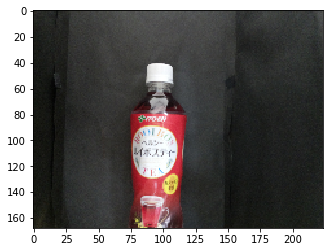


物体検出あと
(126, 37, 3)


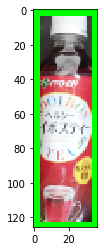


分類器の判断
----result--------
  Rooibos_tea
------END--------



元画像
CC_lemon.jpg
(2464, 3280, 3)


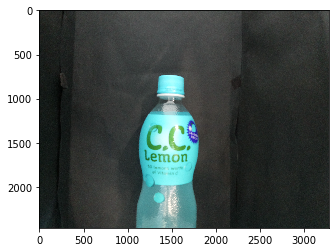


色変換あと
(2464, 3280, 3)


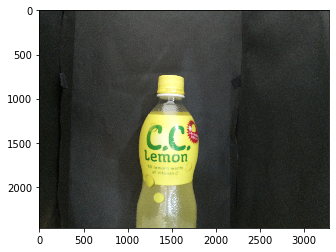


スケールダウンあと
(168, 224, 3)


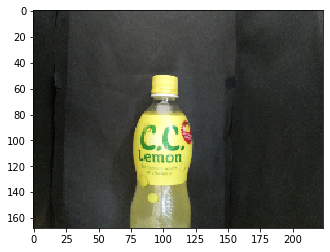


物体検出あと
(117, 45, 3)


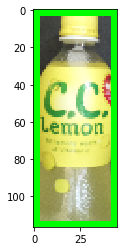


分類器の判断
----result--------
  CC_lemon
------END--------



元画像
Aquarius.jpg
(2464, 3280, 3)


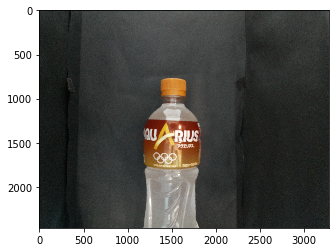


色変換あと
(2464, 3280, 3)


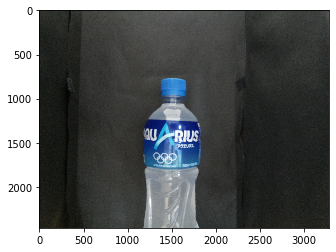


スケールダウンあと
(168, 224, 3)


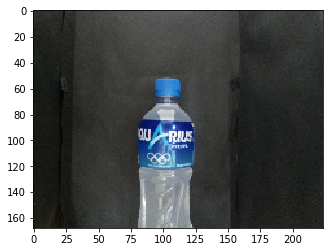


物体検出あと
(114, 40, 3)


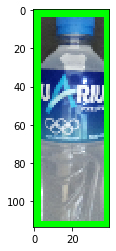


分類器の判断
----result--------
  Aquarius
------END--------



元画像
Carbonic_water.jpg
(2464, 3280, 3)


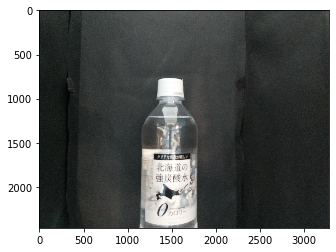


色変換あと
(2464, 3280, 3)


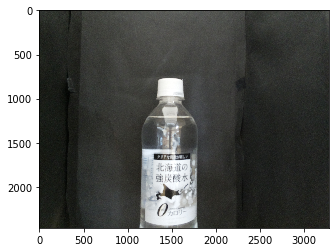


スケールダウンあと
(168, 224, 3)


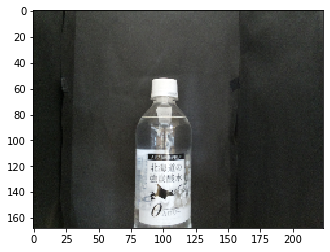


物体検出あと
(115, 43, 3)


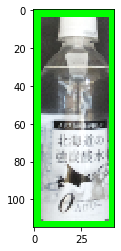


分類器の判断
----result--------
  Carbonic_water
------END--------



元画像
Jasmin_tea.jpg
(2464, 3280, 3)


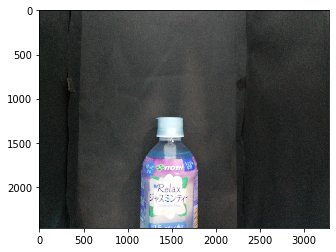


色変換あと
(2464, 3280, 3)


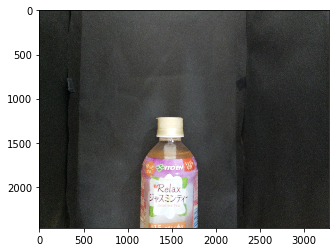


スケールダウンあと
(168, 224, 3)


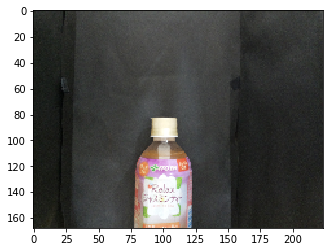


物体検出あと
(84, 43, 3)


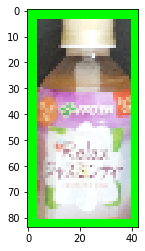


分類器の判断
----result--------
  Jasmin_tea
------END--------



^^^^^^^^^^^^^^^^^^^^^^^
その他画像でについてのモデル精度
^^^^^^^^^^^^^^^^^^^^^^^
元画像
geogia.jpg
(2464, 3280, 3)


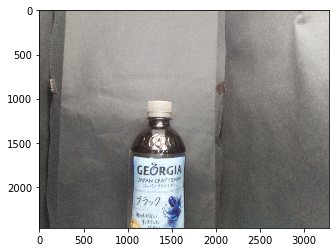


色変換あと
(2464, 3280, 3)


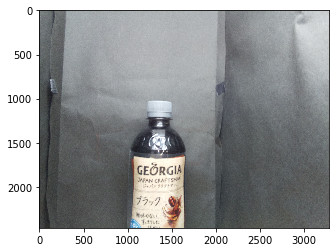


スケールダウンあと
(168, 224, 3)


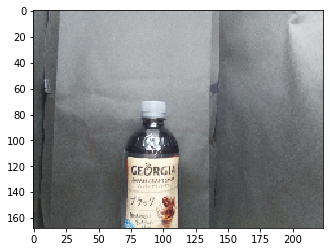


物体検出あと
(167, 223, 3)


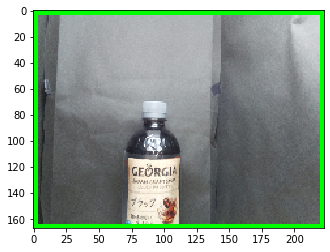


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
namacha.jpg
(2464, 3280, 3)


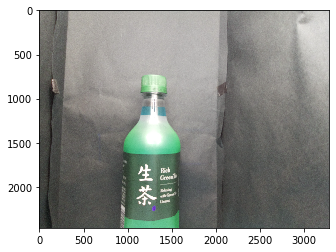


色変換あと
(2464, 3280, 3)


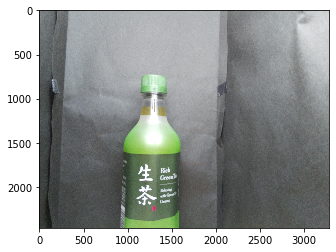


スケールダウンあと
(168, 224, 3)


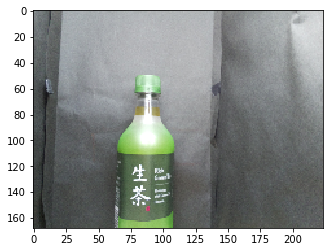


物体検出あと
(167, 223, 3)


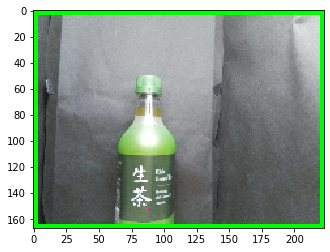


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
namacha3.jpg
(2464, 3280, 3)


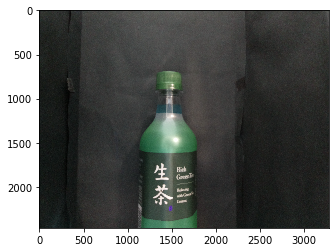


色変換あと
(2464, 3280, 3)


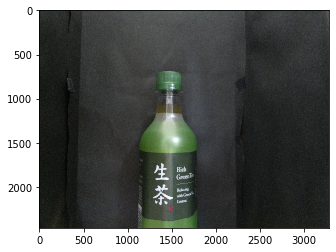


スケールダウンあと
(168, 224, 3)


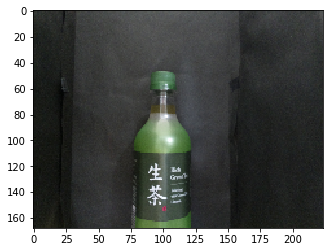


物体検出あと
(93, 22, 3)


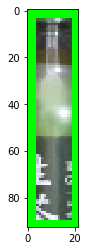


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
namacha2.jpg
(2464, 3280, 3)


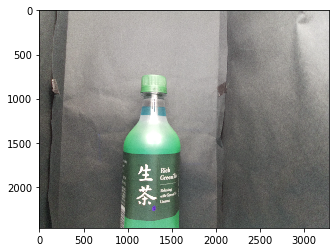


色変換あと
(2464, 3280, 3)


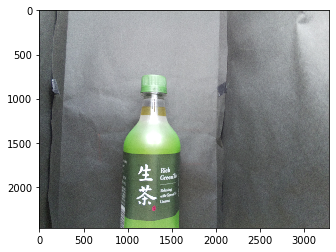


スケールダウンあと
(168, 224, 3)


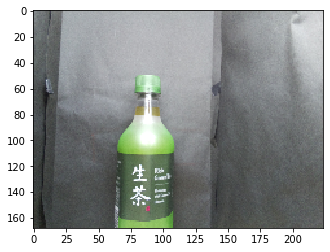


物体検出あと
(167, 223, 3)


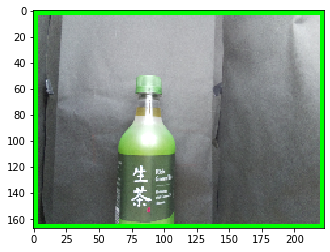


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
georgia4.jpg
(2464, 3280, 3)


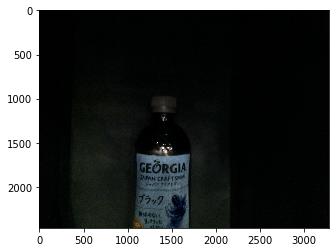


色変換あと
(2464, 3280, 3)


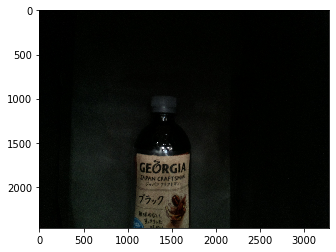


スケールダウンあと
(168, 224, 3)


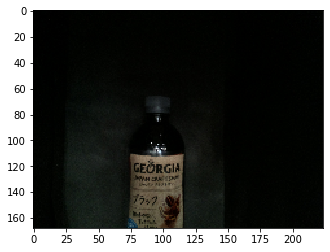


物体検出あと
(109, 169, 3)


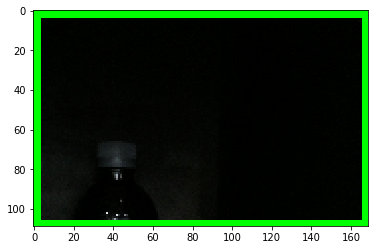


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
water4.jpg
(2464, 3280, 3)


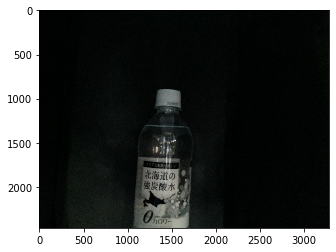


色変換あと
(2464, 3280, 3)


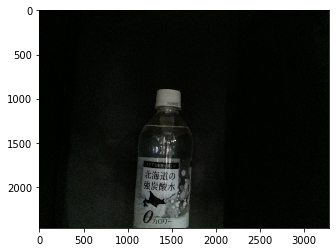


スケールダウンあと
(168, 224, 3)


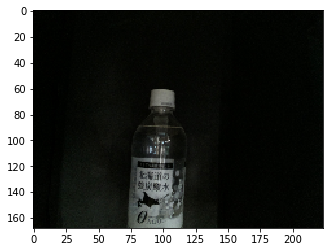


物体検出あと
(167, 165, 3)


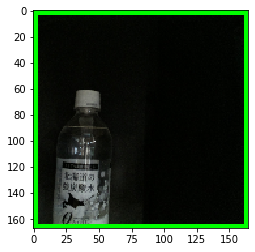


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
cc4.jpg
(2464, 3280, 3)


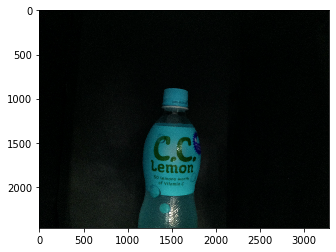


色変換あと
(2464, 3280, 3)


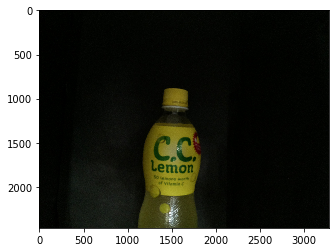


スケールダウンあと
(168, 224, 3)


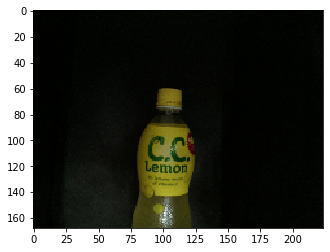


物体検出あと
(163, 165, 3)


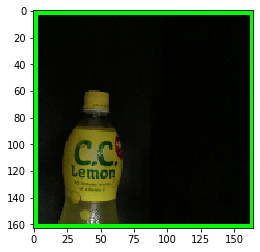


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
aquari.jpg
(2464, 3280, 3)


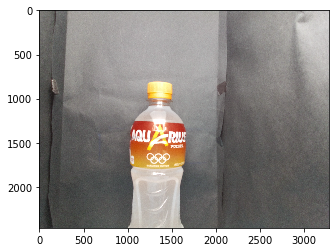


色変換あと
(2464, 3280, 3)


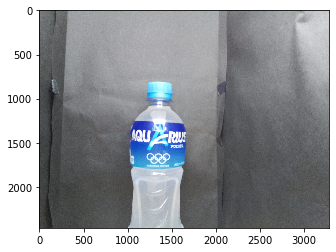


スケールダウンあと
(168, 224, 3)


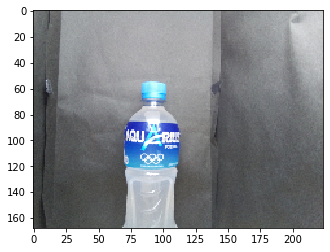


物体検出あと
(167, 223, 3)


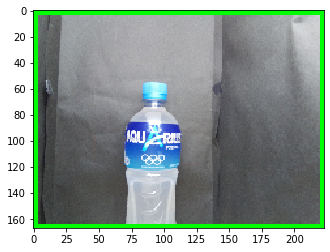


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
jasmin4.jpg
(2464, 3280, 3)


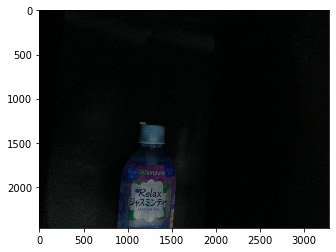


色変換あと
(2464, 3280, 3)


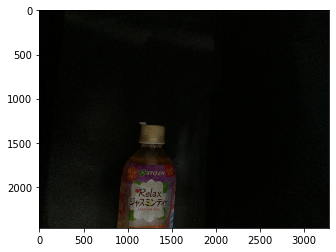


スケールダウンあと
(168, 224, 3)


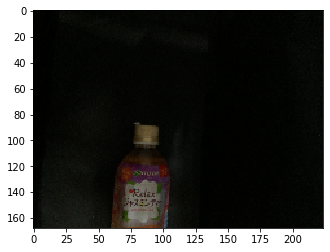


物体検出あと
(159, 164, 3)


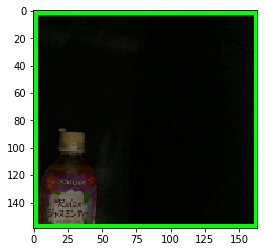


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
aquari3.jpg
(2464, 3280, 3)


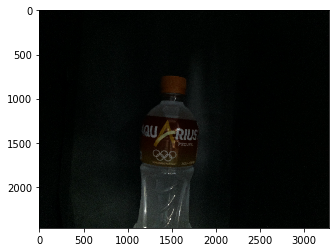


色変換あと
(2464, 3280, 3)


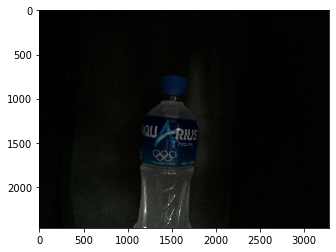


スケールダウンあと
(168, 224, 3)


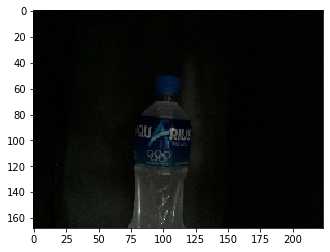


物体検出あと
(155, 168, 3)


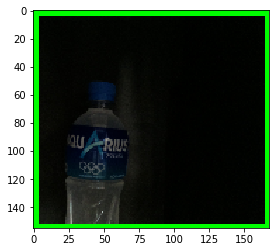


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
pepushi.jpg
(2464, 3280, 3)


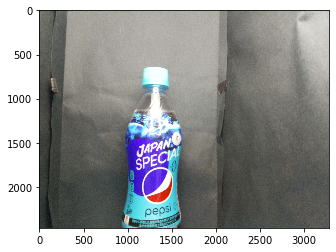


色変換あと
(2464, 3280, 3)


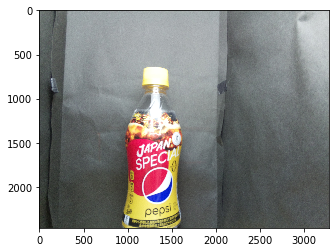


スケールダウンあと
(168, 224, 3)


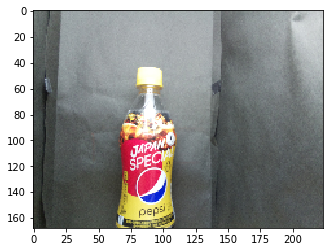


物体検出あと
(167, 214, 3)


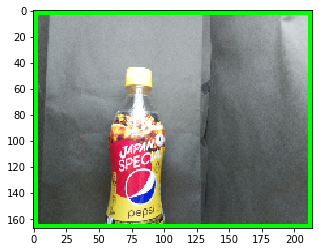


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
water.jpg
(2464, 3280, 3)


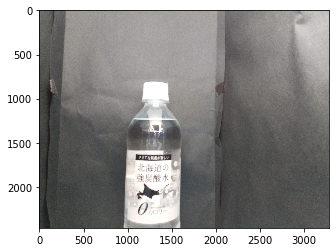


色変換あと
(2464, 3280, 3)


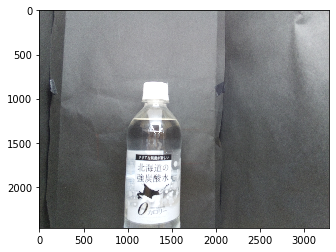


スケールダウンあと
(168, 224, 3)


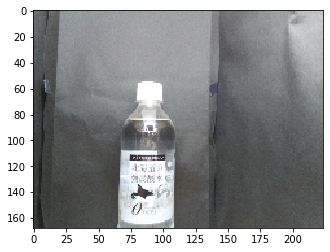


物体検出あと
(167, 214, 3)


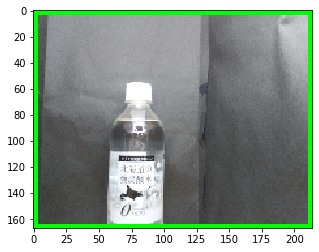


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
ruibos6.jpg
(2464, 3280, 3)


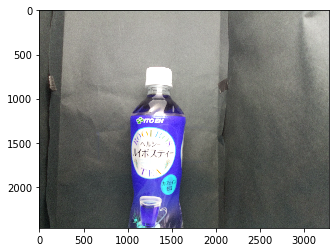


色変換あと
(2464, 3280, 3)


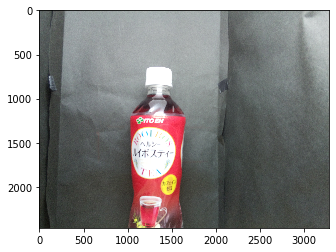


スケールダウンあと
(168, 224, 3)


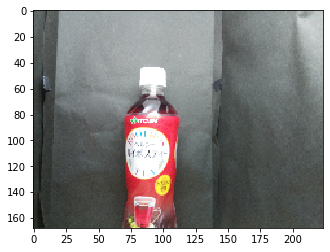


物体検出あと
(167, 215, 3)


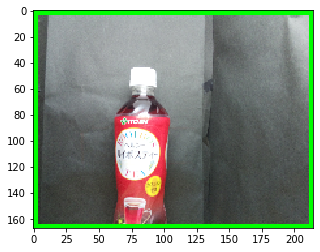


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
pepushi5.jpg
(2464, 3280, 3)


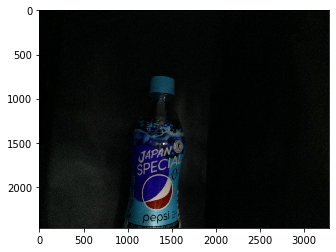


色変換あと
(2464, 3280, 3)


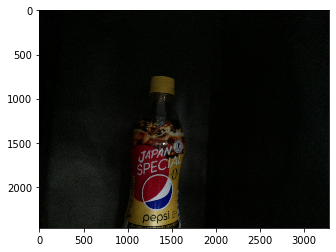


スケールダウンあと
(168, 224, 3)


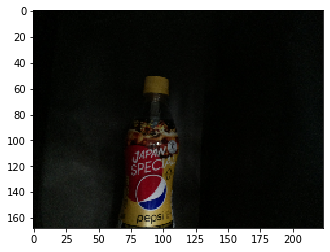


物体検出あと
(167, 165, 3)


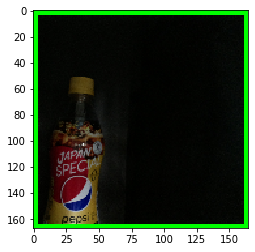


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
ruibos4.jpg
(2464, 3280, 3)


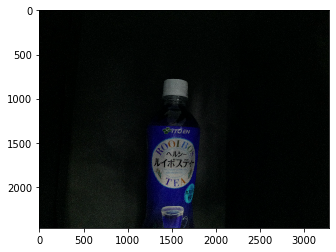


色変換あと
(2464, 3280, 3)


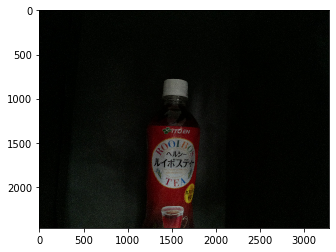


スケールダウンあと
(168, 224, 3)


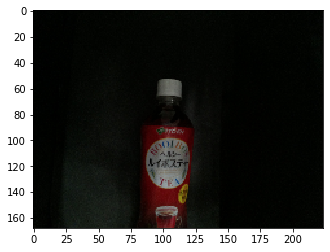


物体検出あと
(135, 165, 3)


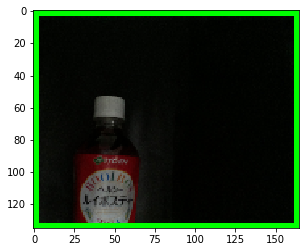


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
pepushi2.jpg
(2464, 3280, 3)


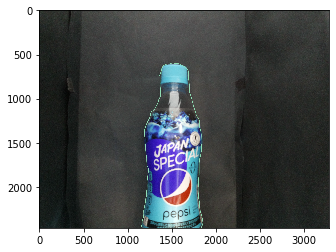


色変換あと
(2464, 3280, 3)


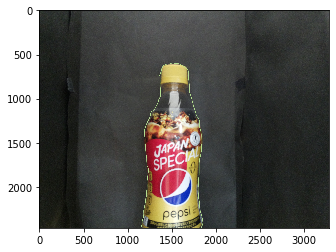


スケールダウンあと
(168, 224, 3)


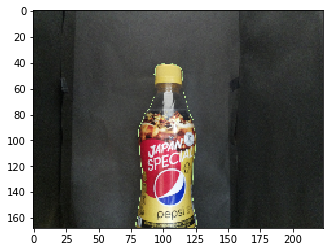


物体検出あと
(126, 39, 3)


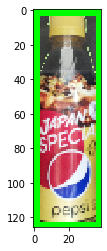


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
jasmin.jpg
(2464, 3280, 3)


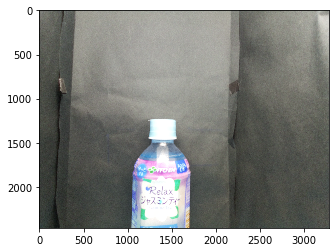


色変換あと
(2464, 3280, 3)


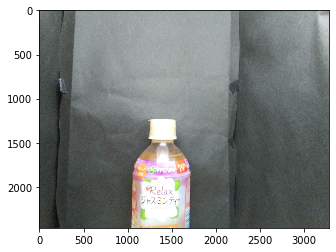


スケールダウンあと
(168, 224, 3)


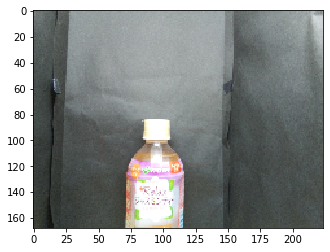


物体検出あと
(167, 207, 3)


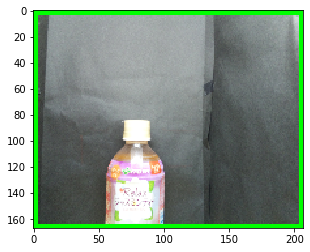


分類器の判断
----------RESULT--------
登録商品ではありません
-----------END--^^------



元画像
cc.jpg
(2464, 3280, 3)


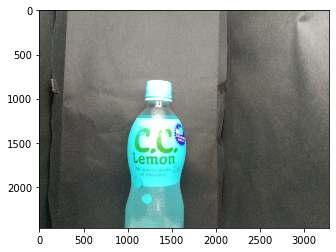


色変換あと
(2464, 3280, 3)


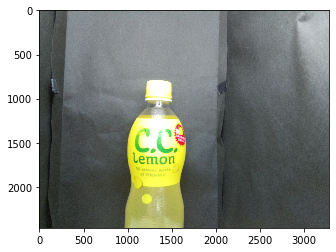


スケールダウンあと
(168, 224, 3)


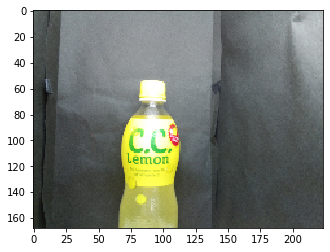


物体検出あと
(167, 204, 3)


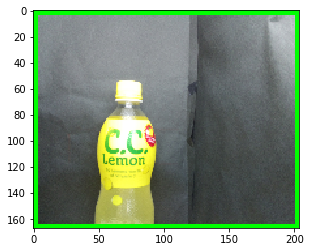


分類器の判断
----result--------
  CC_lemon
------END--------





In [98]:
print('====================')
print('背景に使った写真')
print('====================')

print(background_image.shape)
plt.imshow(background_image)
plt.show()
print()
print()
print()

print('**************************')
print('登録写真についてのモデル精度')
print('**************************')
for data in temp_files:   
    temp = cv2.imread(temp_path + "/" + data)
    print('元画像')
    print(data)
    print(temp.shape)
    plt.imshow(temp)
    plt.show()
    print()

    temp = cv2.cvtColor(temp,cv2.COLOR_BGR2RGB)
    print('色変換あと')
    print(temp.shape)
    plt.imshow(temp)
    plt.show()
    print()

    temp = scale_to_width(temp, 224)
    print('スケールダウンあと')
    print(temp.shape)
    plt.imshow(temp)
    plt.show()
    print()

    box_added_pic, temp = objection_detect(background_image, temp)
    print('物体検出あと')
    print(temp.shape)
    plt.imshow(temp)
    plt.show()
    print()

    print('分類器の判断')
    name = classfiler(temp_files, temp_data, temp, param=0.59, num=6)

    if not name:
        print('----------RESULT--------')
        print("登録商品ではありません")
        print('-----------END--^^------')
    # その他　マッチした商品名を伝えて、今の小計金額を連絡。
    else:
        
        print('----result--------')
        print('  '+str(name))
        print('------END--------')
    print()
    print()
    print()

print('^^^^^^^^^^^^^^^^^^^^^^^')
print('その他画像でについてのモデル精度')
print('^^^^^^^^^^^^^^^^^^^^^^^')
for files in camera_files:
    # 撮影画像読み込み
    img = cv2.imread(path_camera_pic + "/" + files)
    print('元画像')
    print(files)
    print(img.shape)
    plt.imshow(img)
    plt.show()
    print()
    
    # 画像をBGRカラーに変換
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    print('色変換あと')
    print(img.shape)
    plt.imshow(img)
    plt.show()
    print()
    
    img = scale_to_width(img, 224)
    print('スケールダウンあと')
    print(img.shape)
    plt.imshow(img)
    plt.show()
    print()

    box_added_pic, img = objection_detect(background_image, img)
    print('物体検出あと')
    print(img.shape)
    plt.imshow(img)
    plt.show()
    print()
    
    print('分類器の判断')
    name = classfiler(temp_files, temp_data, img, param=0.59, num=6)

    if not name:
        print('----------RESULT--------')
        print("登録商品ではありません")
        print('-----------END--^^------')
    # その他　マッチした商品名を伝えて、今の小計金額を連絡。
    else:
        
        print('----result--------')
        print('  '+str(name))
        print('------END--------')
    print()
    print()
    print()


### 撮影環境は３パターン
#### １、撮影ボックスのライトON、教室のライトON 　（見た目：背景の黒が黒光りする。
#### 2、撮影ボックスのライトOFF、教室のライトON　（見た目：背景は黒くなるが、ペットボトルが教室の明かりを反射させる。）
#### 3、撮影ボックスのライトOFF、教室のライトOFF　（見た目：全体的に黒くなる　）
#### 登録写真と背景は２の環境で撮影した。

### わかったこと
#### 登録　した背景画像が黒なので、画像全体が黒いと物体検出できない。
#### 生茶は黒っぽいので物体検出むずい。
#### 背景の黒シートが少しでもひかるとだめだ
#### 登録写真外では、唯一CC_lemonの環境1で撮ったやつが当たった。(物体検出できてないが）